# DRAEM-MVTecAD

# IMPORT DATASET UTILS

In [1]:
# Installazione delle dipendenze
%pip install  anomalib[full]==2.0.0  -q
    
%pip install  pandas


  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 11.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.1/661.1 kB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.3/224.3 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.3/35.3 MB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.1/727.1 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.1/323.1 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 39.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.0/29.0 MB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 95.4 MB/s eta 0:0

In [2]:
# Import delle librerie necessarie
import os
import numpy as np
import torch
from pathlib import Path
import shutil
import tarfile
import time
import random
import cv2
from PIL import Image

import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage
import zipfile

from tensorboard.backend.event_processing import event_accumulator


from anomalib.data import MVTecAD
from anomalib.data import Folder
from anomalib.callbacks.checkpoint import ModelCheckpoint
from anomalib.loggers import AnomalibTensorBoardLogger
from anomalib.engine import Engine
from anomalib.models import Draem


/usr/local/lib/python3.11/dist-packages/openvino/runtime/__init__.py:10: DeprecationWarning: The `openvino.runtime` module is deprecated and will be removed in the 2026.0 release. Please replace `openvino.runtime` with `openvino`.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [ ]:

# Preparazione del dataset MVTecAD
src_folder = Path("/kaggle/input/mvtec-ad/")
dst_folder = Path("/kaggle/working/datasets/MVTecAD")

try:
    shutil.copytree(
        src_folder,
        dst_folder,
        ignore_dangling_symlinks=True,
        dirs_exist_ok=True
    )
    print(f"[MVTecAD dataset preparato, salvato in {dst_folder}")
except FileNotFoundError:
    print("Cartella sorgente non trovata")
except FileExistsError:
    print("Percorso di destinazione già esistente")

[MVTecAD dataset preparato, salvato in /kaggle/working/datasets/MVTecAD


In [4]:
results = {}
models = {}

In [ ]:
def plot_training_loss_by_epoch(log_dir, category):
    version_path = os.path.join(log_dir, "default", "version_0")
    if not os.path.exists(version_path):
        print(f"Directory non trovata per {category}: {version_path}")
        return

    event_file = None
    for file in os.listdir(version_path):
        if "events.out.tfevents" in file:
            event_file = os.path.join(version_path, file)
            break

    if not event_file:
        print(f"Nessun file events.out.tfevents trovato per {category} in {version_path}")
        return

    try:
        ea = event_accumulator.EventAccumulator(event_file)
        ea.Reload()

        loss_tag = 'train_loss_epoch'

        if loss_tag in ea.Tags()["scalars"]:
            train_loss = ea.Scalars(loss_tag)
            
            # Estrai i valori originali
            original_steps = [x.step for x in train_loss]
            values = [x.value for x in train_loss]

            
            normalized_epochs = list(range(1, len(values) + 1))

            
            plt.figure(figsize=(10, 5))
            plt.plot(normalized_epochs, values, marker='o', linestyle='-', label=f"{category}")
            plt.title(f"Training Loss - {category}")
            plt.xlabel("Epoca")
            plt.ylabel("Loss")
            plt.grid(True)
            plt.legend()
            plt.tight_layout()
            plt.show()
        else:
            print(f"Il tag '{loss_tag}' non è presente per la categoria {category}")

    except Exception as e:
        print(f"Errore durante il parsing del file per {category}: {e}")

# TRAIN

In [ ]:

MVTecAD_categories = ['bottle', 'cable', 'capsule', 'carpet', 'grid', 'hazelnut', 'leather', 'metal_nut', 'pill', 'screw', 'tile', 'toothbrush', 'transistor', 'wood', 'zipper']  
#MVTecAD_categories = ['bottle', 'cable']

## FASE DI TRAINING ##
print("\n" + "="*50)
print("FASE DI TRAINING")
print("="*50 + "\n")

for category in MVTecAD_categories:
    print(f"\n\n=== Inizio training per la categoria: {category} ===")    
   
    # Configurazione del datamodule
    datamodule = MVTecAD(
        root="/kaggle/working/datasets/MVTecAD",
        category=category,        
        num_workers=2,
        train_batch_size=2,
    )    
    datamodule.setup()

    # Configurazione del logger
    logger = AnomalibTensorBoardLogger(
        save_dir=Path("results")/"logger"/category,
        log_graph=False,
    )
    
    # Configurazione del checkpoint )
    checkpoint_callback = ModelCheckpoint(dirpath="/tmp",save_weights_only=True)

    # Configurazione del modello 
    model = Draem()

    # Configurazione dell'engine
    engine = Engine(        
        callbacks=[checkpoint_callback],     
        logger=logger,
        log_every_n_steps=10,
        accelerator="auto",
        devices="auto",
        strategy="auto",  
        max_epochs=15,
        enable_progress_bar=True,
        
    )

    

    # Training
    print(f"\n=== Training per {category} ===\n\n")
    engine.fit(model=model, datamodule=datamodule)
    
    # Salva il modello addestrato per il testing successivo
    models[category] = {
        'model': model,
        'datamodule': datamodule,
        'engine': engine
    }


FASE DI TRAINING



=== Inizio training per la categoria: bottle ===

=== Training per bottle ===




2025-05-25 09:50:50.089487: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748166650.307523      18 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748166650.372799      18 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0  

Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: cable ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per cable ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: capsule ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per capsule ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: carpet ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per carpet ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: grid ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per grid ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: hazelnut ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per hazelnut ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: leather ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per leather ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: metal_nut ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per metal_nut ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: pill ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per pill ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: screw ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per screw ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: tile ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per tile ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: toothbrush ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode



=== Training per toothbrush ===




Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: transistor ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per transistor ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: wood ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per wood ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]



=== Inizio training per la categoria: zipper ===


/usr/local/lib/python3.11/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /tmp exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



=== Training per zipper ===




INFO: 
  | Name           | Type                   | Params | Mode 
------------------------------------------------------------------
0 | pre_processor  | PreProcessor           | 0      | train
1 | post_processor | PostProcessor          | 0      | train
2 | evaluator      | Evaluator              | 0      | train
3 | augmenter      | PerlinAnomalyGenerator | 0      | train
4 | model          | DraemModel             | 97.4 M | train
5 | loss           | DraemLoss              | 0      | train
------------------------------------------------------------------
97.4 M    Trainable params
0         Non-trainable params
97.4 M    Total params
389.691   Total estimated model params size (MB)
236       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

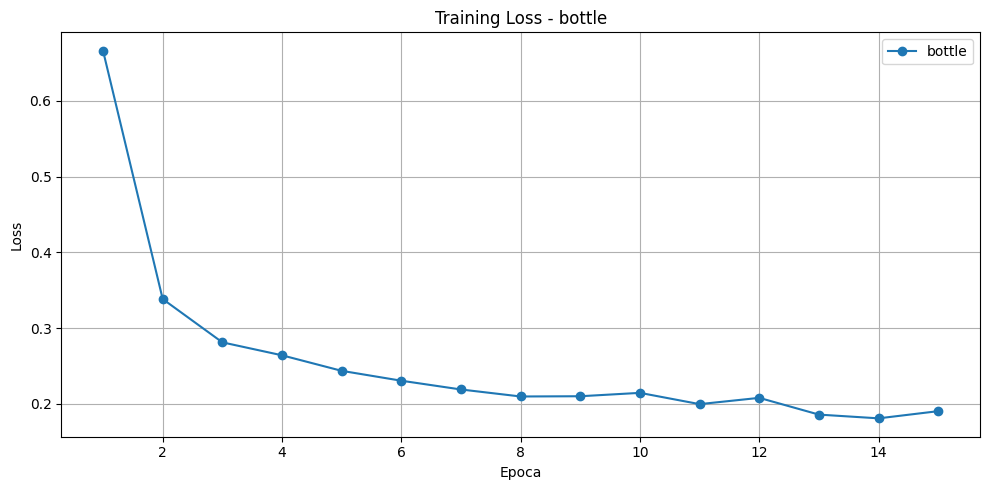

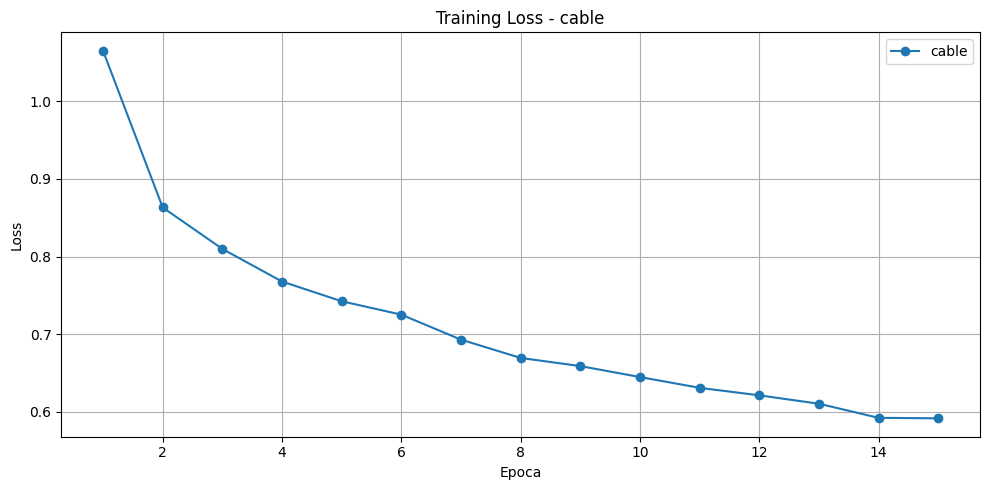

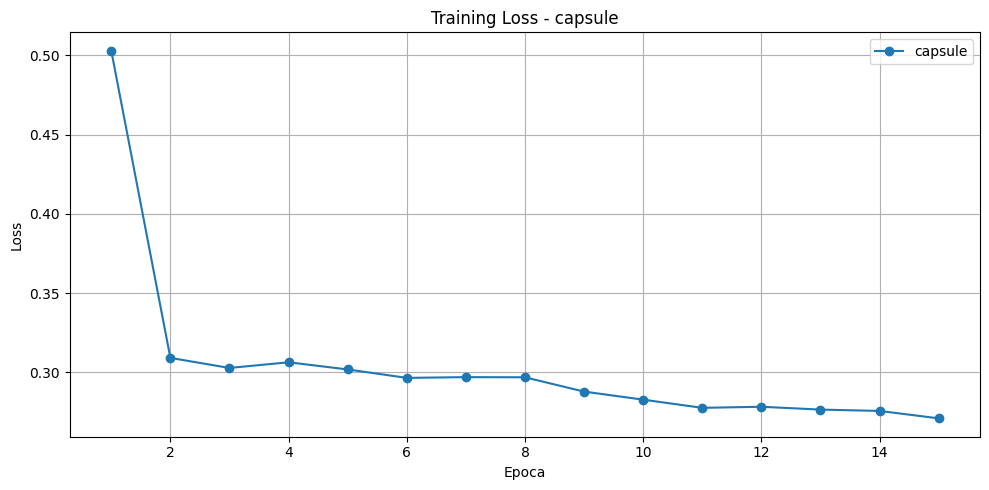

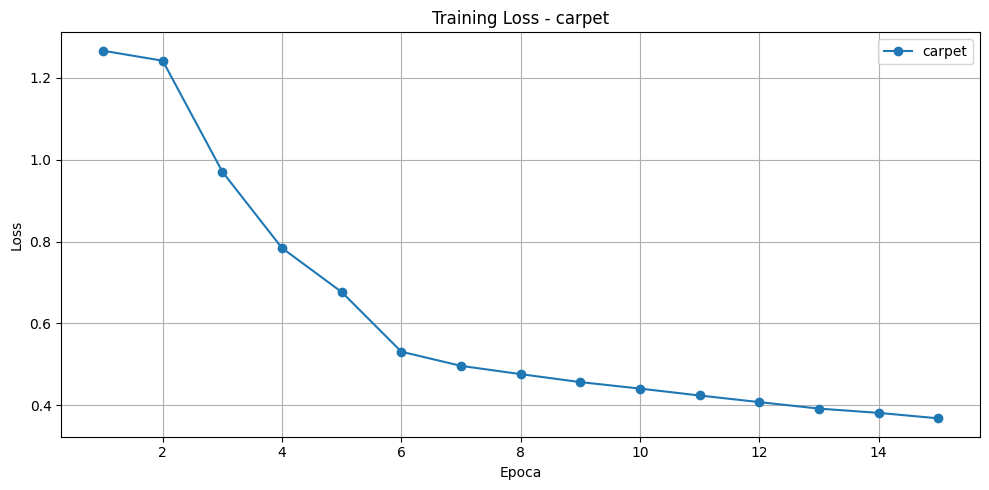

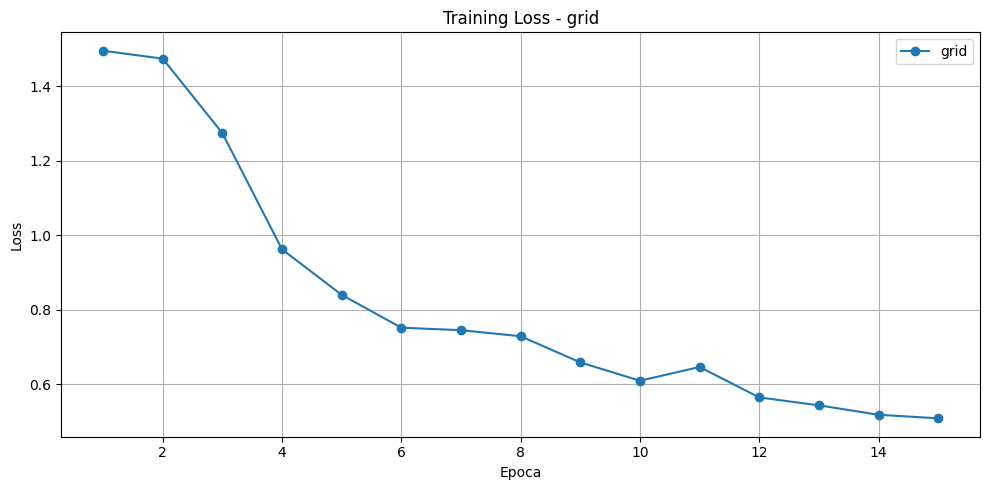

...

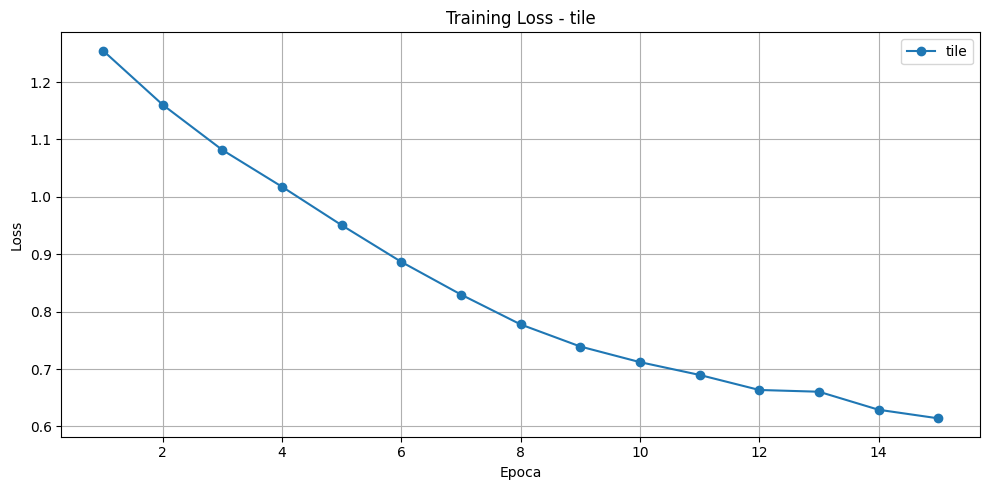

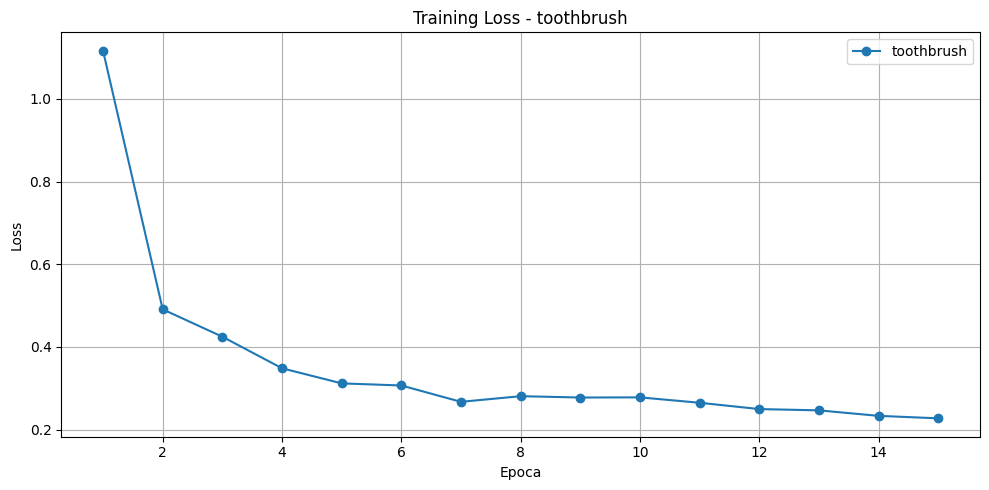

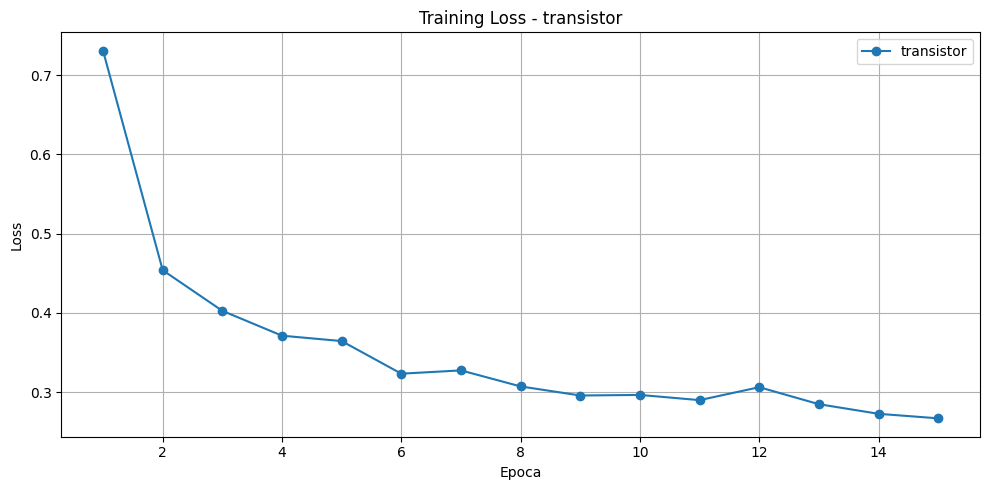

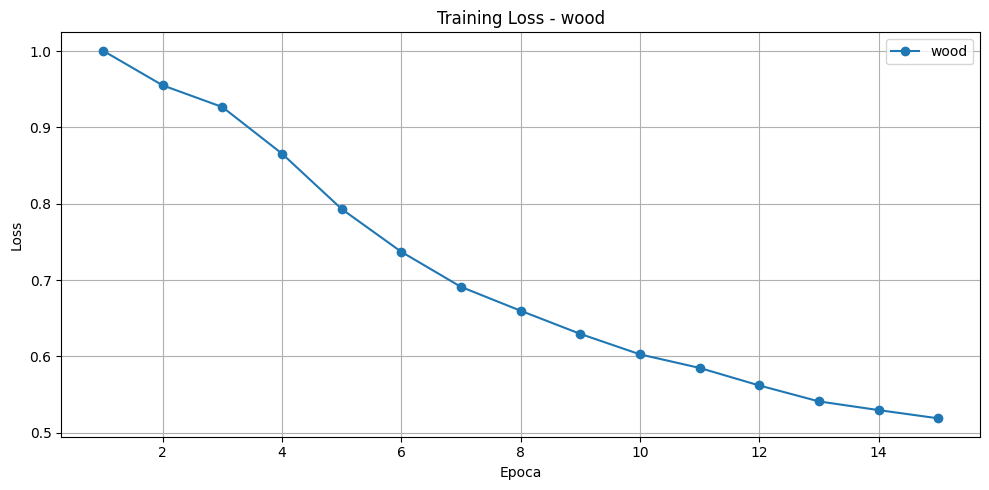

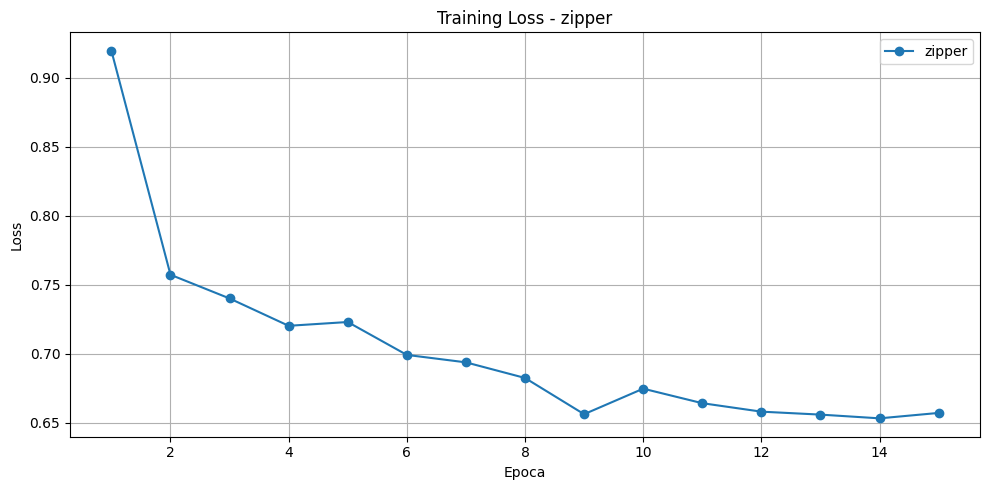

In [7]:
for category in MVTecAD_categories:
    log_dir = Path("results") / "logger" / category
    plot_training_loss_by_epoch(log_dir, category)

# TEST

In [8]:

## FASE DI TESTING ##
print("\n" + "="*50)
print("FASE DI TESTING")
print("="*50 + "\n")

# Dizionari per memorizzare i risultati
results = {}  # Per i risultati del modello (scores)
inference_speed = {}  # Per le metriche di velocità

for category in MVTecAD_categories:
    print(f"\n=== Inizio testing per la categoria: {category} ===")
    
    # Recupera il modello e i componenti salvati
    model_data = models[category]
    model = model_data['model']
    datamodule = model_data['datamodule']
    engine = model_data['engine']
    
    # Misura il tempo di inferenza
    print(f"=== Testing per {category} ===")
    start_time = time.time()
    
    scores = engine.test(model=model, datamodule=datamodule)
    
    end_time = time.time()
    total_time = end_time - start_time
    
    # Calcola le metriche di velocità
    test_dataset = datamodule.test_data
    num_images = len(test_dataset)
    avg_time_per_image = total_time / num_images
    throughput = num_images / total_time  # immagini/secondo
    
    # Salvataggio dei risultati
    results[category] = scores
    inference_speed[category] = {
        'total_inference_time': total_time,
        'num_images': num_images,
        'avg_time_per_image': avg_time_per_image,
        'throughput_img_per_sec': throughput
    }
    
    # Stampa i risultati
    print(f"\nMetriche di velocità per {category}:")
    print(f"- Tempo totale: {total_time:.2f} secondi")
    print(f"- Immagini processate: {num_images}")
    print(f"- Tempo medio per immagine: {avg_time_per_image:.4f} secondi")
    print(f"- Throughput: {throughput:.2f} immagini/secondo")

## Stampa riepilogo velocità ##
print("\n" + "="*50)
print("RIEPILOGO VELOCITÀ DI INFERENZA")
print("="*50 + "\n")

print("{:<20} {:<12} {:<16} {:<18} {:<15}".format(
    "Categoria", "Immagini", "Tempo Totale", "Tempo/Immagine", "Throughput"))
print("-"*85)

for category, speed in inference_speed.items():
    print("{:<20} {:<12} {:<16.2f} {:<18.4f} {:<15.2f}".format(
        category,
        speed['num_images'],
        speed['total_inference_time'],
        speed['avg_time_per_image'],
        speed['throughput_img_per_sec']))

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



FASE DI TESTING


=== Inizio testing per la categoria: bottle ===
=== Testing per bottle ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9055556058883667     │
│       image_F1Score       │    0.9037036895751953     │
│        pixel_AUROC        │    0.8150487542152405     │
│       pixel_F1Score       │     0.462554931640625     │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per bottle:
- Tempo totale: 13.91 secondi
- Immagini processate: 83
- Tempo medio per immagine: 0.1675 secondi
- Throughput: 5.97 immagini/secondo

=== Inizio testing per la categoria: cable ===
=== Testing per cable ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.6362444162368774     │
│       image_F1Score       │    0.7659574747085571     │
│        pixel_AUROC        │    0.4679343104362488     │
│       pixel_F1Score       │    0.09707987308502197    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per cable:
- Tempo totale: 28.62 secondi
- Immagini processate: 150
- Tempo medio per immagine: 0.1908 secondi
- Throughput: 5.24 immagini/secondo

=== Inizio testing per la categoria: capsule ===
=== Testing per capsule ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.6561627388000488     │
│       image_F1Score       │     0.902953565120697     │
│        pixel_AUROC        │    0.7936675548553467     │
│       pixel_F1Score       │    0.1520494818687439     │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per capsule:
- Tempo totale: 28.21 secondi
- Immagini processate: 132
- Tempo medio per immagine: 0.2137 secondi
- Throughput: 4.68 immagini/secondo

=== Inizio testing per la categoria: carpet ===
=== Testing per carpet ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.5317014455795288     │
│       image_F1Score       │    0.8613861203193665     │
│        pixel_AUROC        │    0.5934404730796814     │
│       pixel_F1Score       │    0.13376674056053162    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per carpet:
- Tempo totale: 20.39 secondi
- Immagini processate: 117
- Tempo medio per immagine: 0.1743 secondi
- Throughput: 5.74 immagini/secondo

=== Inizio testing per la categoria: grid ===
=== Testing per grid ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.38847118616104126    │
│       image_F1Score       │    0.8358209133148193     │
│        pixel_AUROC        │    0.4830976724624634     │
│       pixel_F1Score       │   0.013708336278796196    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per grid:
- Tempo totale: 12.51 secondi
- Immagini processate: 78
- Tempo medio per immagine: 0.1604 secondi
- Throughput: 6.24 immagini/secondo

=== Inizio testing per la categoria: hazelnut ===
=== Testing per hazelnut ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.8217856884002686     │
│       image_F1Score       │    0.8322981595993042     │
│        pixel_AUROC        │    0.8712043762207031     │
│       pixel_F1Score       │    0.34783464670181274    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per hazelnut:
- Tempo totale: 22.70 secondi
- Immagini processate: 110
- Tempo medio per immagine: 0.2064 secondi
- Throughput: 4.85 immagini/secondo

=== Inizio testing per la categoria: leather ===
=== Testing per leather ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.49184781312942505    │
│       image_F1Score       │    0.8504672646522522     │
│        pixel_AUROC        │    0.4969061017036438     │
│       pixel_F1Score       │    0.21839170157909393    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per leather:
- Tempo totale: 21.75 secondi
- Immagini processate: 124
- Tempo medio per immagine: 0.1754 secondi
- Throughput: 5.70 immagini/secondo

=== Inizio testing per la categoria: metal_nut ===
=== Testing per metal_nut ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.6224340796470642     │
│       image_F1Score       │    0.8888888955116272     │
│        pixel_AUROC        │    0.7679733037948608     │
│       pixel_F1Score       │    0.37057194113731384    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per metal_nut:
- Tempo totale: 18.59 secondi
- Immagini processate: 115
- Tempo medio per immagine: 0.1617 secondi
- Throughput: 6.18 immagini/secondo

=== Inizio testing per la categoria: pill ===
=== Testing per pill ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.5583742260932922     │
│       image_F1Score       │    0.9120520949363708     │
│        pixel_AUROC        │    0.8701840043067932     │
│       pixel_F1Score       │    0.38030269742012024    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per pill:
- Tempo totale: 29.32 secondi
- Immagini processate: 167
- Tempo medio per immagine: 0.1756 secondi
- Throughput: 5.70 immagini/secondo

=== Inizio testing per la categoria: screw ===
=== Testing per screw ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.7392908334732056     │
│       image_F1Score       │    0.8641975522041321     │
│        pixel_AUROC        │    0.9006998538970947     │
│       pixel_F1Score       │    0.09431007504463196    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per screw:
- Tempo totale: 22.96 secondi
- Immagini processate: 160
- Tempo medio per immagine: 0.1435 secondi
- Throughput: 6.97 immagini/secondo

=== Inizio testing per la categoria: tile ===
=== Testing per tile ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.8701298832893372     │
│       image_F1Score       │    0.8729282021522522     │
│        pixel_AUROC        │     0.782537579536438     │
│       pixel_F1Score       │    0.4296222925186157     │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per tile:
- Tempo totale: 18.55 secondi
- Immagini processate: 117
- Tempo medio per immagine: 0.1586 secondi
- Throughput: 6.31 immagini/secondo

=== Inizio testing per la categoria: toothbrush ===
=== Testing per toothbrush ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.6499999761581421     │
│       image_F1Score       │    0.8169013857841492     │
│        pixel_AUROC        │    0.8768324851989746     │
│       pixel_F1Score       │     0.152730792760849     │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per toothbrush:
- Tempo totale: 10.39 secondi
- Immagini processate: 42
- Tempo medio per immagine: 0.2473 secondi
- Throughput: 4.04 immagini/secondo

=== Inizio testing per la categoria: transistor ===
=== Testing per transistor ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.7024999856948853     │
│       image_F1Score       │    0.6274510025978088     │
│        pixel_AUROC        │    0.5782956480979919     │
│       pixel_F1Score       │    0.17592300474643707    │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per transistor:
- Tempo totale: 21.20 secondi
- Immagini processate: 100
- Tempo medio per immagine: 0.2120 secondi
- Throughput: 4.72 immagini/secondo

=== Inizio testing per la categoria: wood ===
=== Testing per wood ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │     0.917543888092041     │
│       image_F1Score       │    0.9279999732971191     │
│        pixel_AUROC        │    0.7937471866607666     │
│       pixel_F1Score       │            0.0            │
└───────────────────────────┴───────────────────────────┘

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Metriche di velocità per wood:
- Tempo totale: 17.31 secondi
- Immagini processate: 79
- Tempo medio per immagine: 0.2192 secondi
- Throughput: 4.56 immagini/secondo

=== Inizio testing per la categoria: zipper ===
=== Testing per zipper ===


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │     0.783088207244873     │
│       image_F1Score       │    0.9047619104385376     │
│        pixel_AUROC        │    0.6029663681983948     │
│       pixel_F1Score       │    0.13995319604873657    │
└───────────────────────────┴───────────────────────────┘


Metriche di velocità per zipper:
- Tempo totale: 21.29 secondi
- Immagini processate: 151
- Tempo medio per immagine: 0.1410 secondi
- Throughput: 7.09 immagini/secondo

RIEPILOGO VELOCITÀ DI INFERENZA

Categoria            Immagini     Tempo Totale     Tempo/Immagine     Throughput     
-------------------------------------------------------------------------------------
bottle               83           13.91            0.1675             5.97           
cable                150          28.62            0.1908             5.24           
capsule              132          28.21            0.2137             4.68           
carpet               117          20.39            0.1743             5.74           
grid                 78           12.51            0.1604             6.24           
hazelnut             110          22.70            0.2064             4.85           
leather              124          21.75            0.1754             5.70           
metal_nut            1

# RISULTATI

In [9]:
# Salvataggio dei risultati in CSV
import csv

def save_test_results(save_path: str, results_dict: dict):
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    
    with open(save_path, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        header = ['Category', 'Image_AUROC', 'Image_F1', 'Pixel_AUROC', 'Pixel_F1']
        writer.writerow(header)

        for category, scores_list in results_dict.items():
            for score_dict in scores_list:
                row = [
                    category,
                    f"{score_dict['image_AUROC']:.4f}",
                    f"{score_dict['image_F1Score']:.4f}",
                    f"{score_dict['pixel_AUROC']:.4f}",
                    f"{score_dict['pixel_F1Score']:.4f}"
                ]
                writer.writerow(row)

save_test_results("/kaggle/working/results/test_results.csv", results)


In [ ]:
import pandas as pd

def results_to_dataframe(results_dict):
    df_data = []
    for category, scores_list in results_dict.items():
        for score_dict in scores_list:
            row = {
                "Category": category,
                "Image AUROC": f"{score_dict['image_AUROC']:.4f}",
                "Image F1-Score": f"{score_dict['image_F1Score']:.4f}",
                "Pixel AUROC": f"{score_dict['pixel_AUROC']:.4f}",
                "Pixel F1-Score": f"{score_dict['pixel_F1Score']:.4f}"
            }
            df_data.append(row)
    return pd.DataFrame(df_data)


results_df = results_to_dataframe(results)


display(results_df)

,Category,Image AUROC,Image F1-Score,Pixel AUROC,Pixel F1-Score
0,bottle,0.9056,0.9037,0.8150,0.4626
1,cable,0.6362,0.7660,0.4679,0.0971
2,capsule,0.6562,0.9030,0.7937,0.1520
3,carpet,0.5317,0.8614,0.5934,0.1338
4,grid,0.3885,0.8358,0.4831,0.0137
5,hazelnut,0.8218,0.8323,0.8712,0.3478
6,leather,0.4918,0.8505,0.4969,0.2184
7,metal_nut,0.6224,0.8889,0.7680,0.3706
8,pill,0.5584,0.9121,0.8702,0.3803
9,screw,0.7393,0.8642,0.9007,0.0943




Risultati per bottle - MVTecAD 




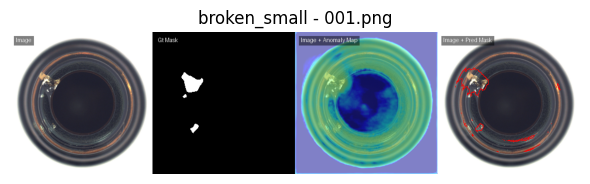

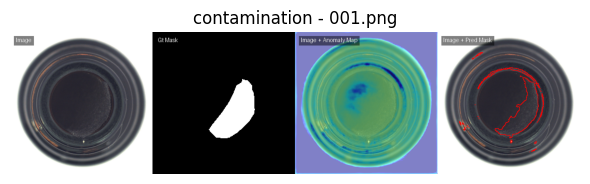

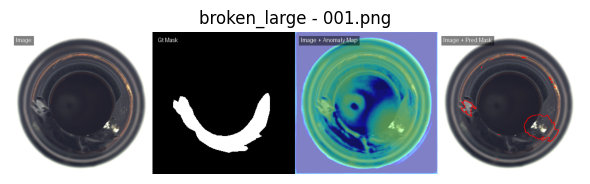

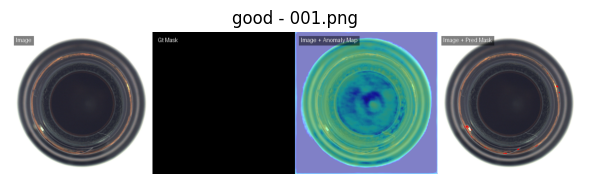



Risultati per cable - MVTecAD 




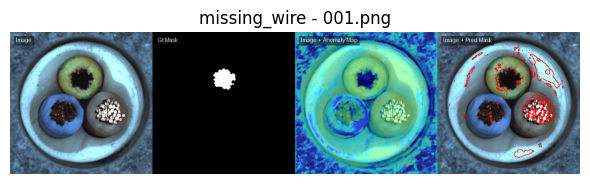

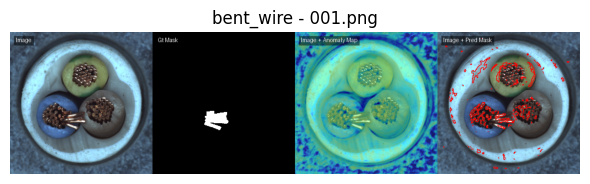

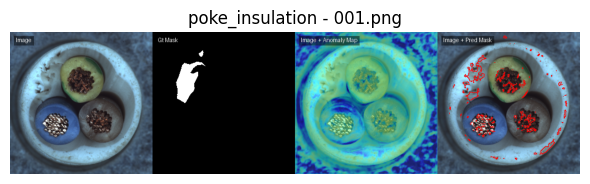

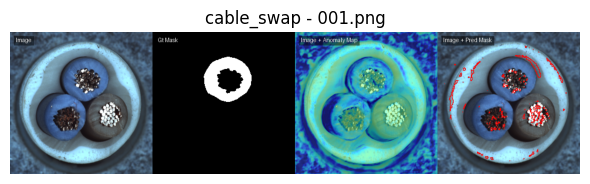

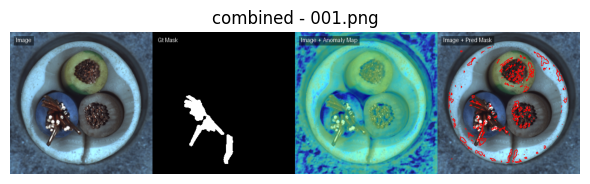

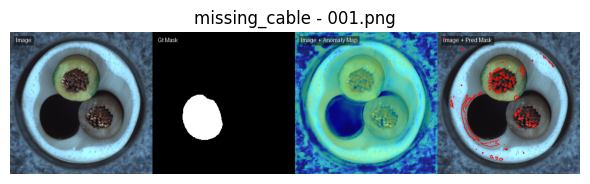

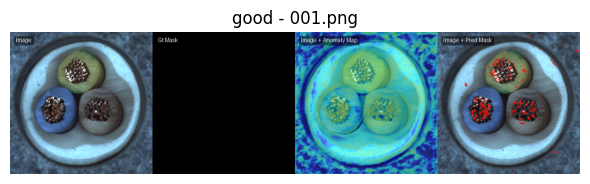

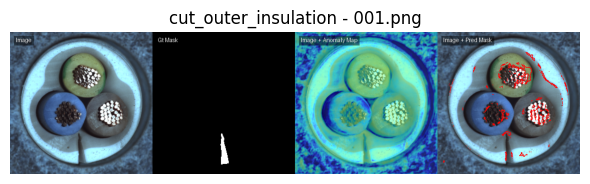

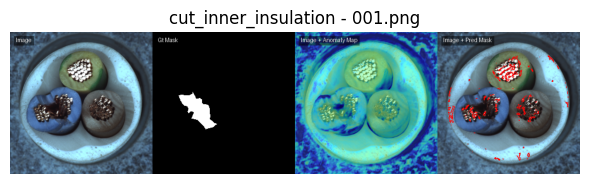



Risultati per capsule - MVTecAD 




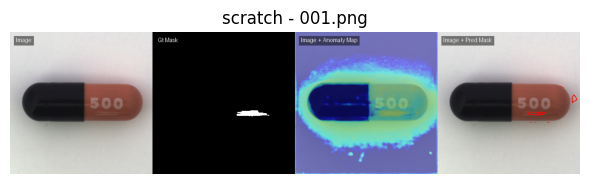

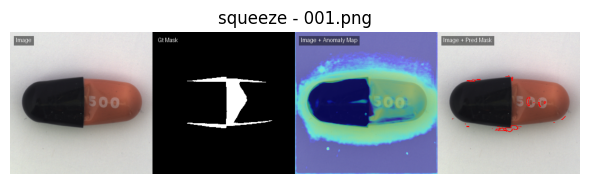

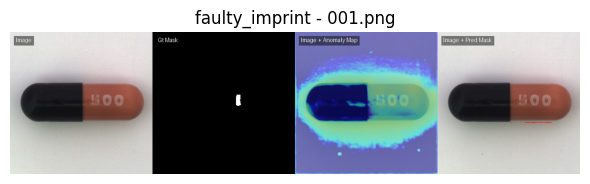

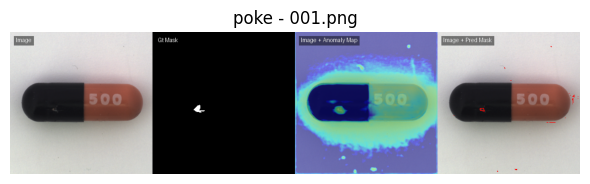

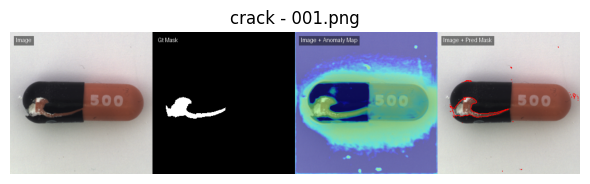

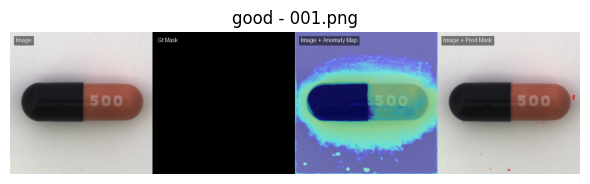



Risultati per carpet - MVTecAD 




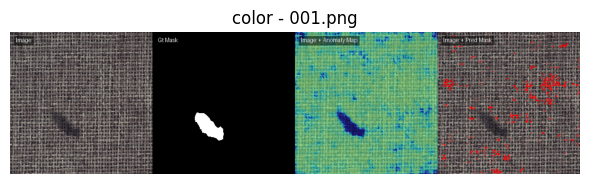

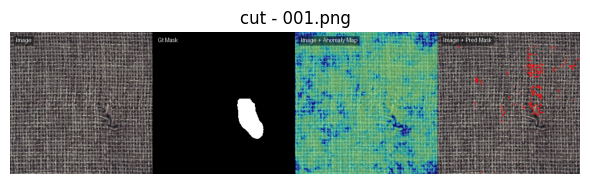

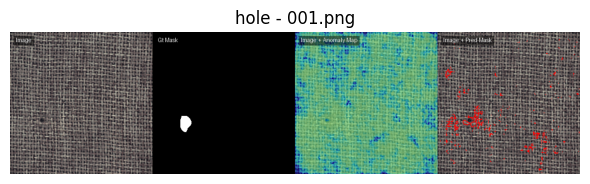

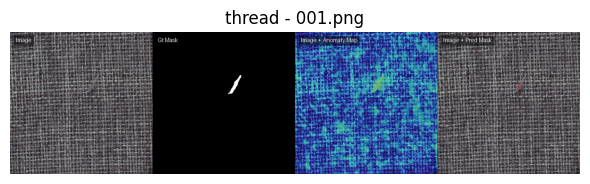

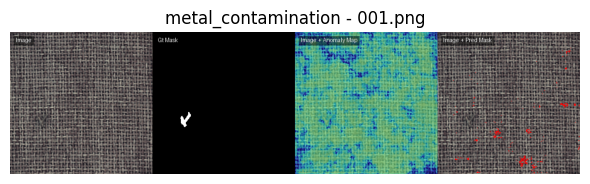

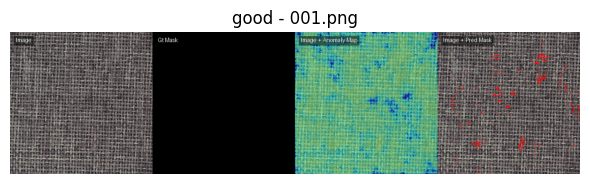



Risultati per grid - MVTecAD 




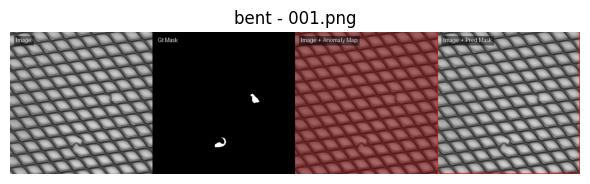

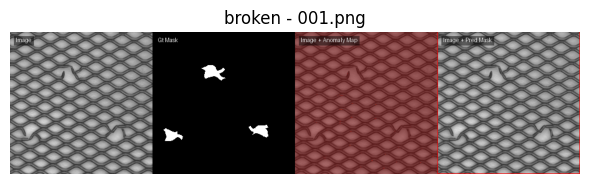

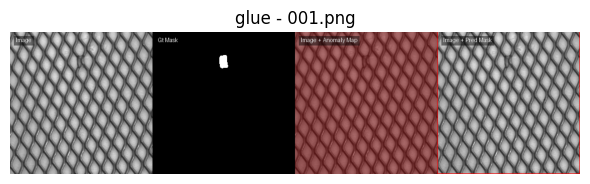

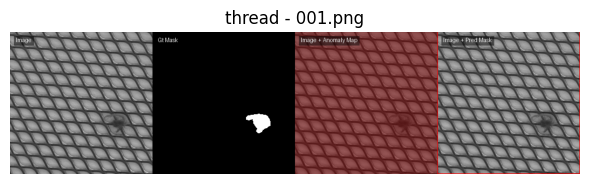

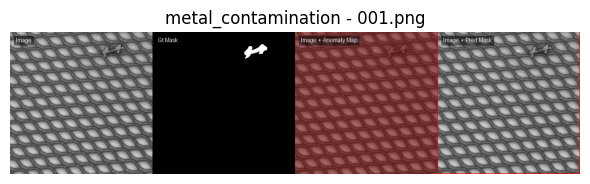

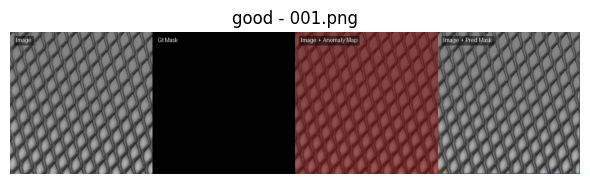



Risultati per hazelnut - MVTecAD 




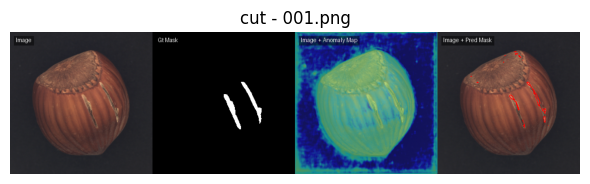

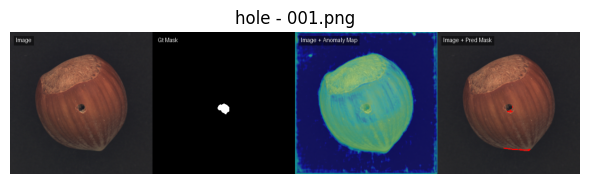

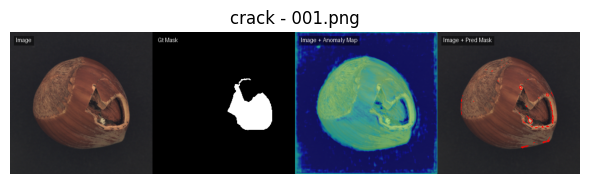

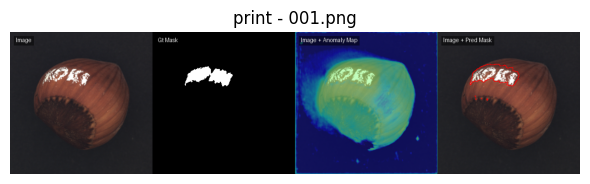

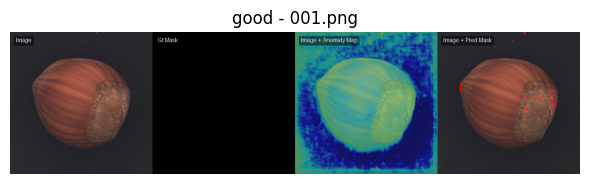



Risultati per leather - MVTecAD 




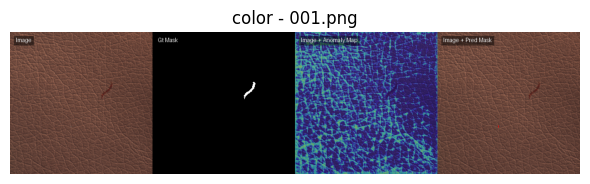

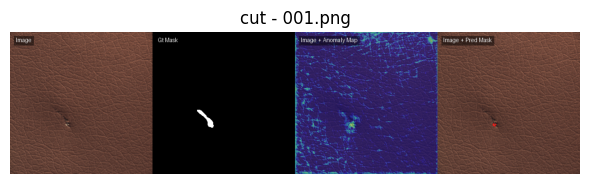

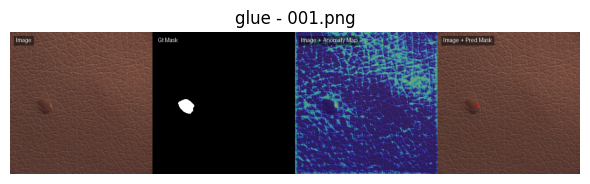

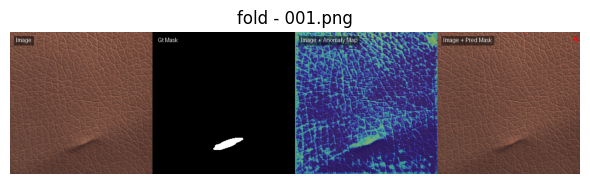

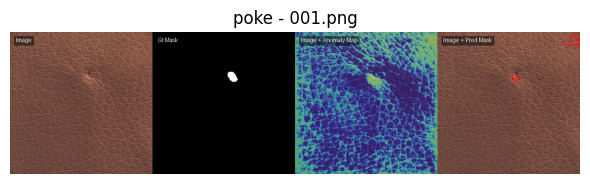

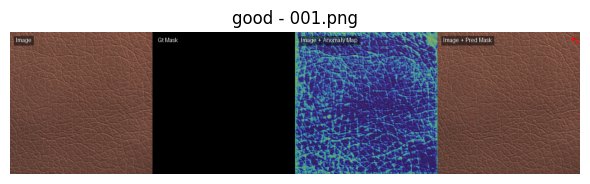



Risultati per metal_nut - MVTecAD 




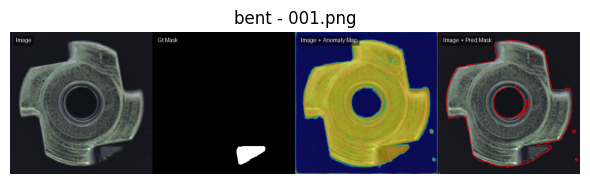

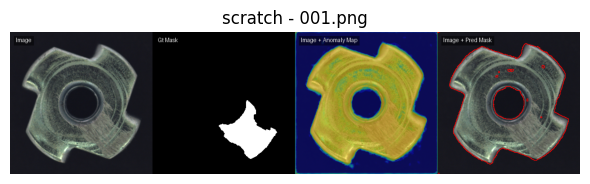

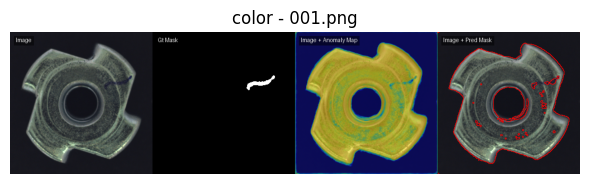

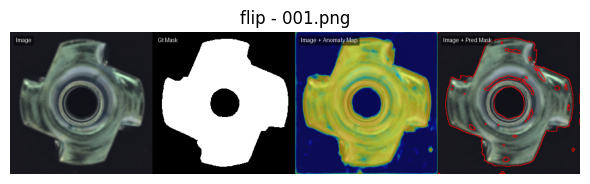

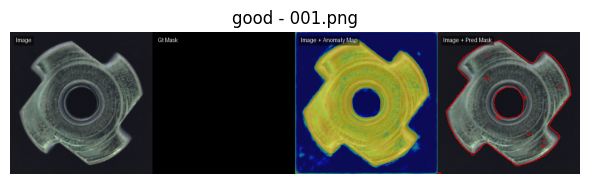



Risultati per pill - MVTecAD 




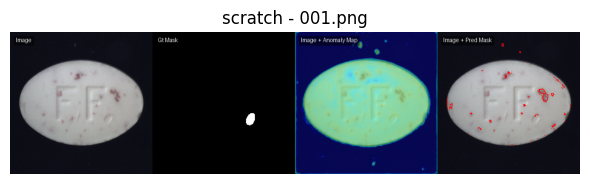

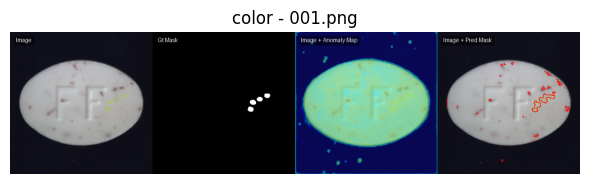

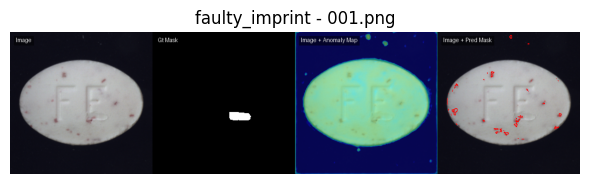

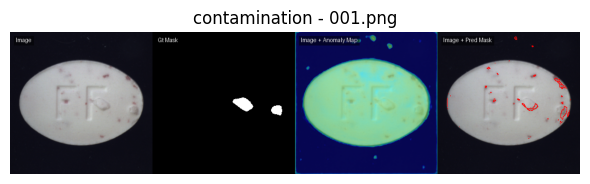

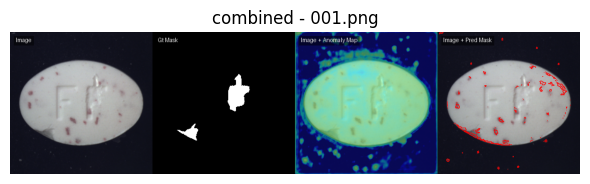

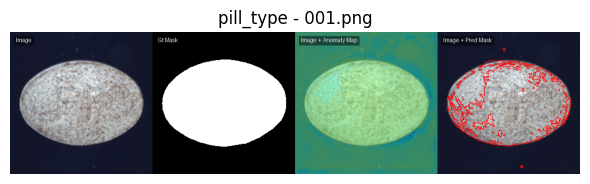

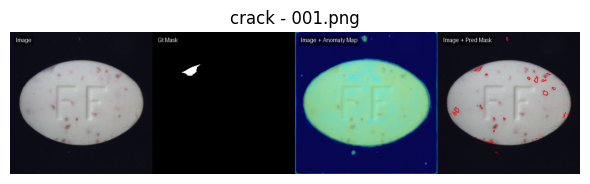

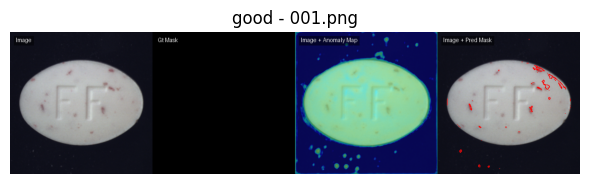



Risultati per screw - MVTecAD 




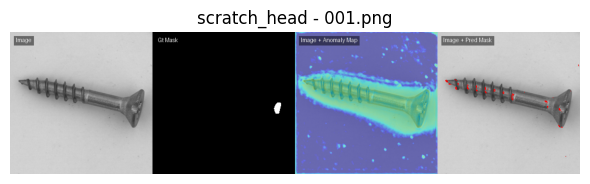

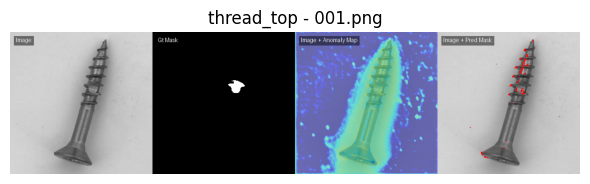

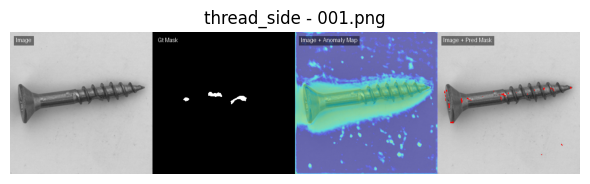

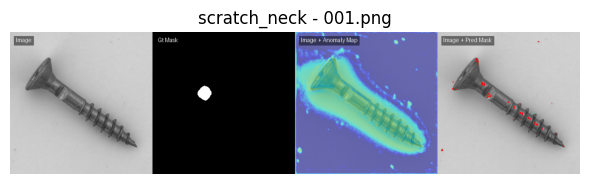

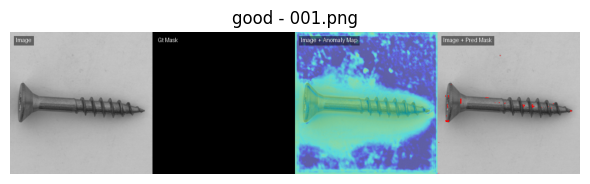

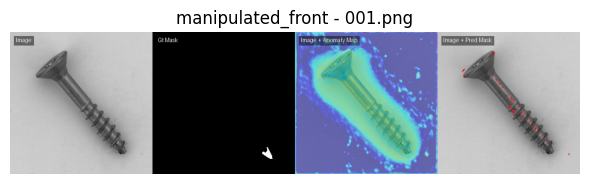



Risultati per tile - MVTecAD 




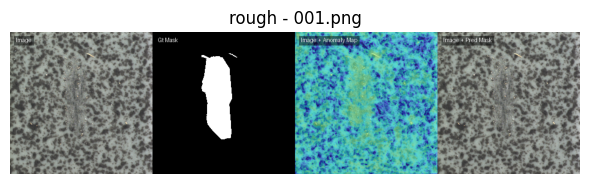

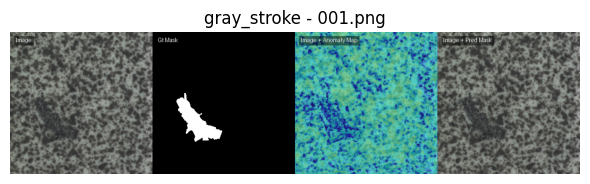

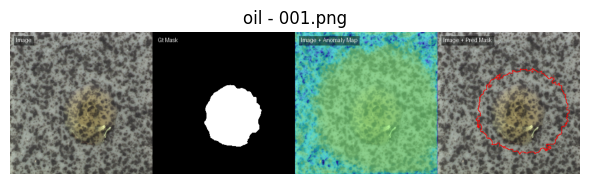

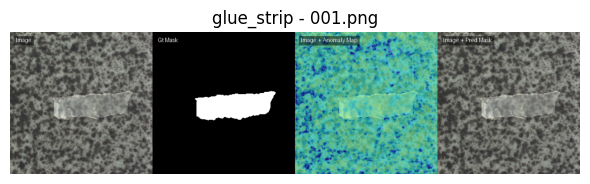

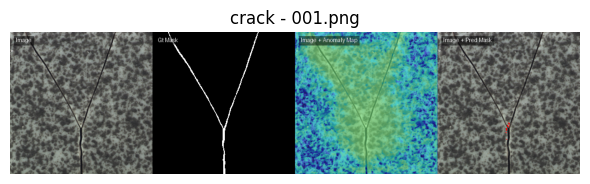

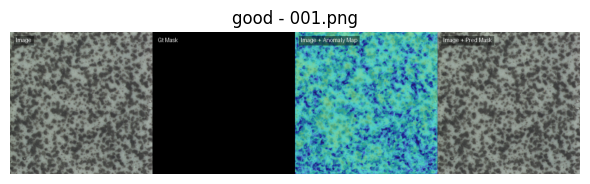



Risultati per toothbrush - MVTecAD 




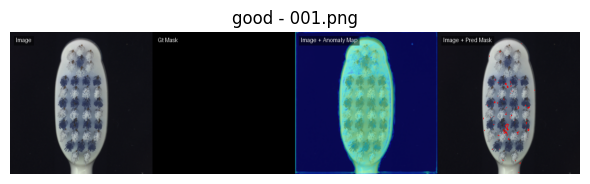

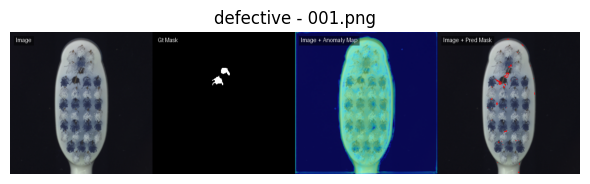



Risultati per transistor - MVTecAD 




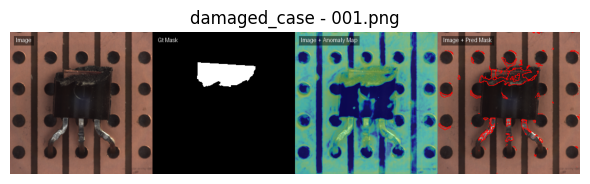

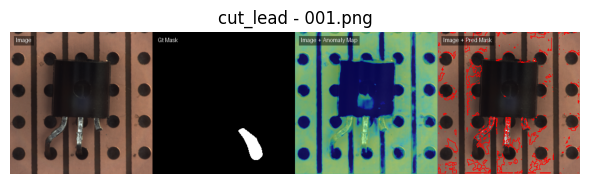

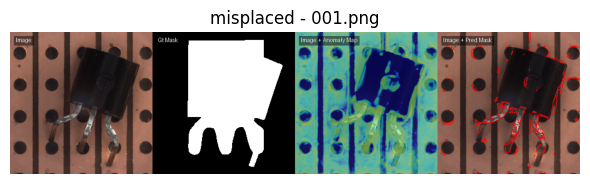

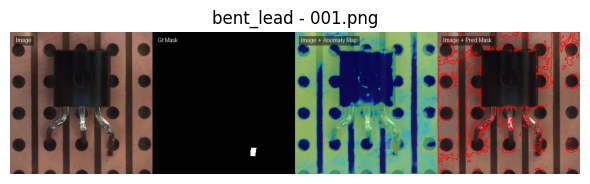

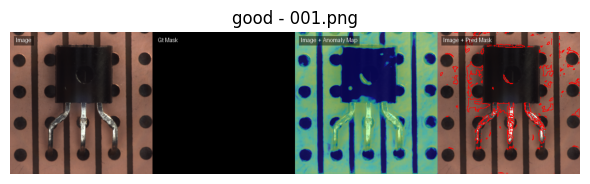



Risultati per wood - MVTecAD 




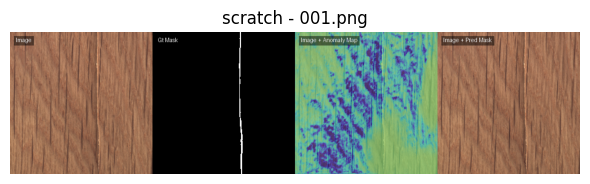

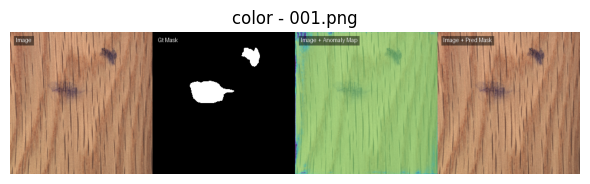

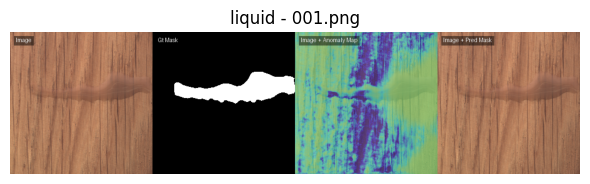

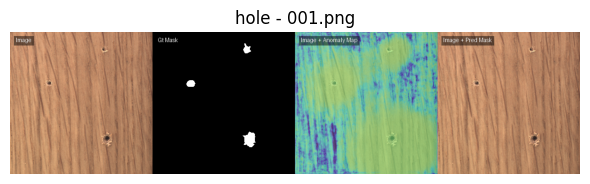

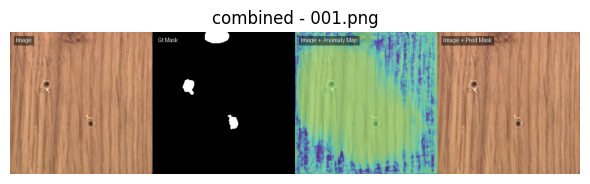

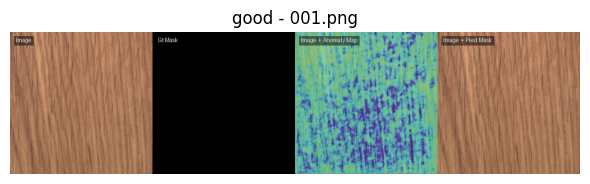



Risultati per zipper - MVTecAD 




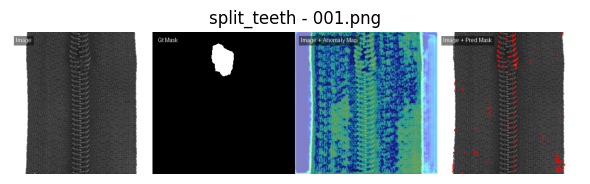

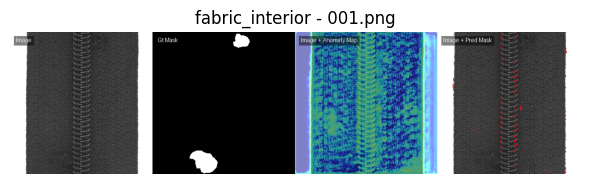

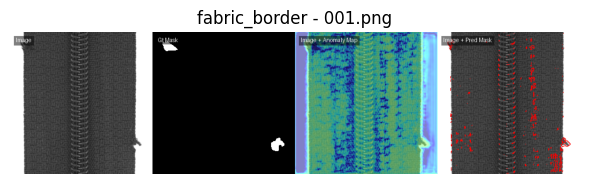

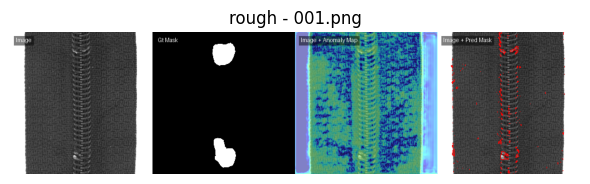

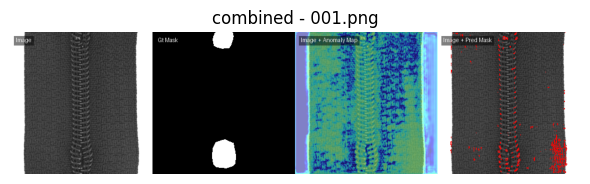

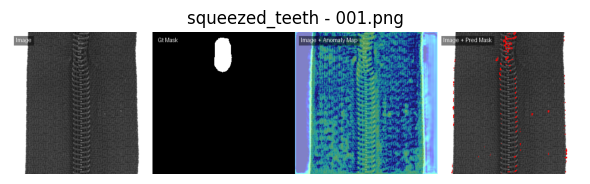

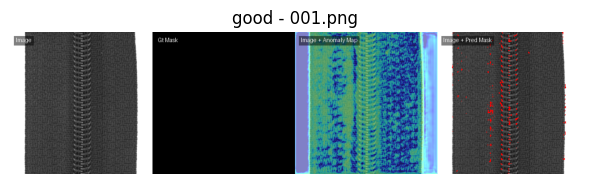

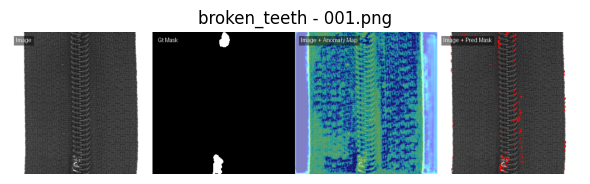

In [ ]:
from pathlib import Path

def show_one_image_per_row(model_name, dataset, category):
    base_path = Path(f"/kaggle/working/results/{model_name}/{dataset}/{category}/v0/images/test")
    
    print(f"\n\nRisultati per {category} - {dataset} \n\n")
    
    subfolders = [f.name for f in os.scandir(base_path) if f.is_dir()]
    
    for subfolder in subfolders:
        folder_path = base_path / subfolder
        image_files = [f for f in os.listdir(folder_path) if f.endswith(('png', 'jpg', 'jpeg'))]
        
        if not image_files:
            continue
        
        # Seleziona una sola immagine a caso
        img_file = image_files[0]  
        img_path = folder_path / img_file
        
        try:
            img = plt.imread(img_path)
            
            
            plt.figure(figsize=(6, 6))
            plt.imshow(img)
            plt.title(f"{subfolder} - {img_file}", fontsize=12)
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Errore nel caricamento di {img_path}: {e}")

# Esempio: mostra una immagine per categoria
for category in MVTecAD_categories :
    show_one_image_per_row("Draem", "MVTecAD", category)

In [12]:
## CREAZIONE ZIP DEI RISULTATI ##
print("\n" + "="*50)
print("CREAZIONE ARCHIVIO RESULTS.ZIP")
print("="*50 + "\n")

def zip_results(source_dir, output_file):
    with zipfile.ZipFile(output_file, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(source_dir):
            for file in files:
                file_path = os.path.join(root, file)
                arcname = os.path.relpath(file_path, start=source_dir)
                zipf.write(file_path, arcname)
    print(f"Creato archivio {output_file} contenente la cartella {source_dir}")

# Percorsi
results_dir = "/kaggle/working/results"
zip_path = "/kaggle/working/results.zip"

# Crea lo zip
zip_results(results_dir, zip_path)


print("\nOperazioni completate con successo!")


CREAZIONE ARCHIVIO RESULTS.ZIP

Creato archivio /kaggle/working/results.zip contenente la cartella /kaggle/working/results

Operazioni completate con successo!
